# Pytorch Lightning

A Batteries Included framework for machine learning research.





<sub>(by Ryan Stout, witharsenal.com)</sub>

# Pytorch

A machine learning framework

# Pytorch Lightning

A machine learning framework for Pytorch

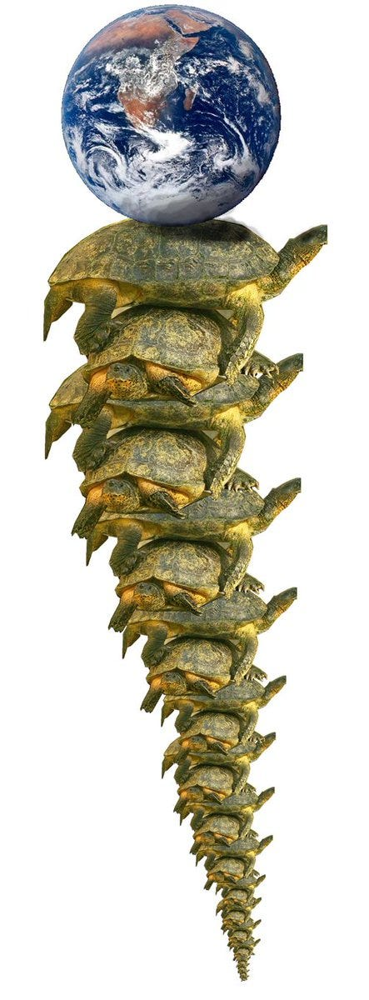

# Is it any good?

YES

# What's it good for?

- eliminiating boiler plate
    - checkpointing
    - saving/restoring
    - mixed percision training
    - distributed training (GPU/TPU/Cluster)
    - more...
- implementing best practices (quickly and easily)


# Basic Problem

boilerplate isn't just wasted time, it creates bugs.
I want to focus on trying new things, not implementation

## Solution

Better abstractions, move biolerplate into framework

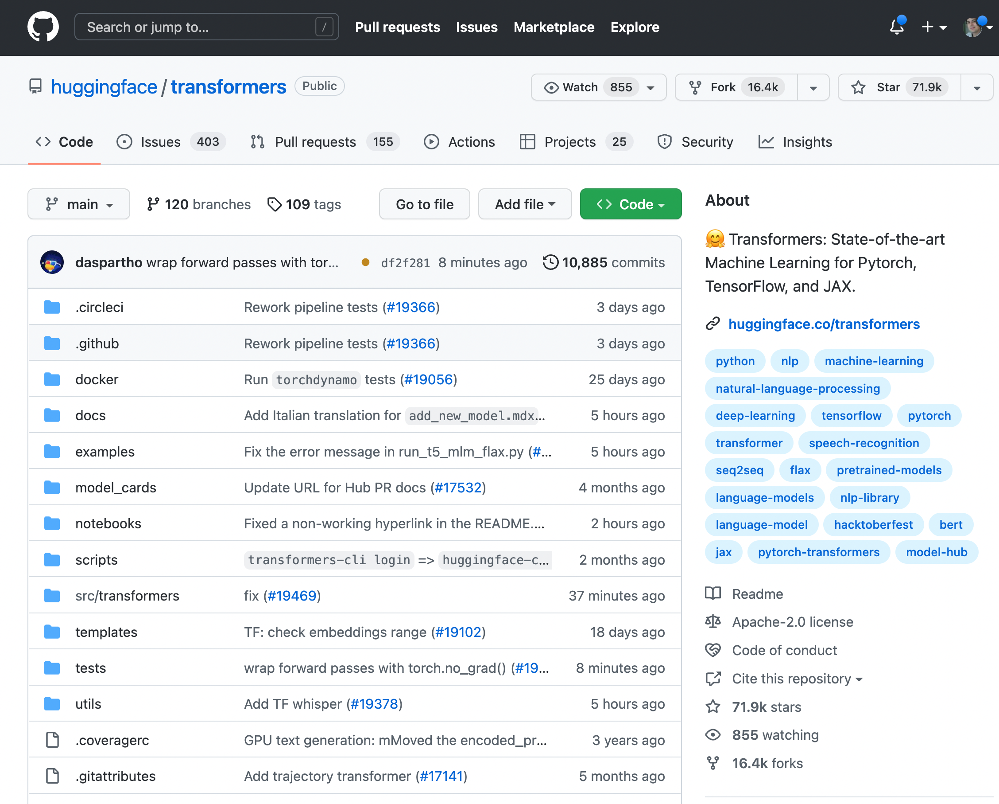

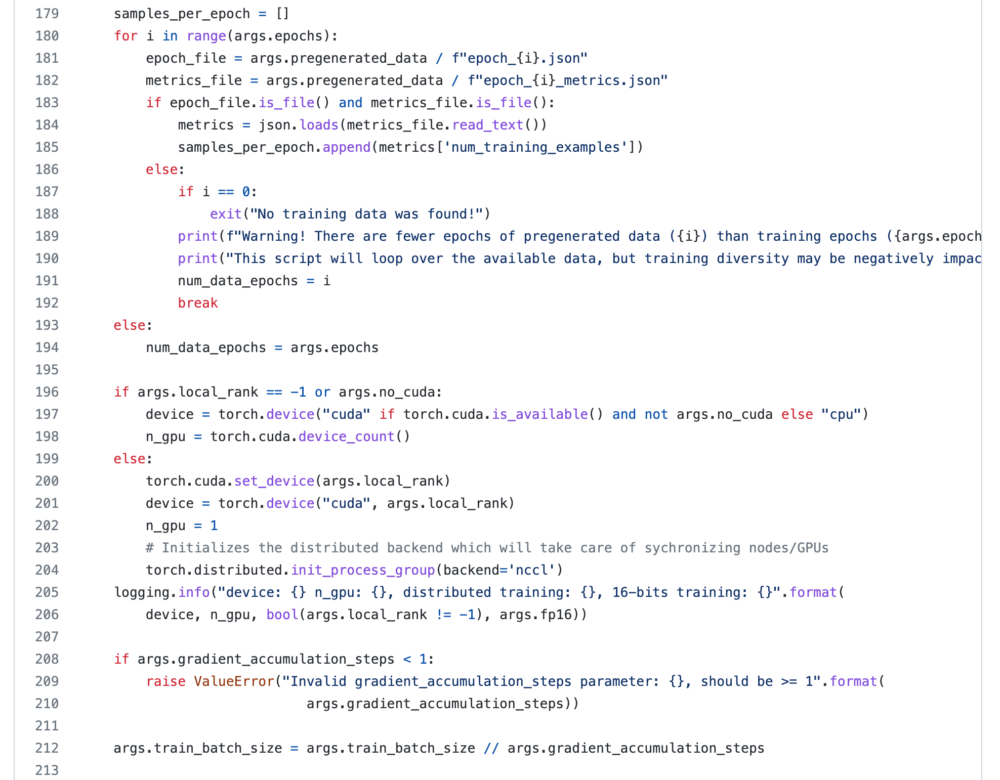

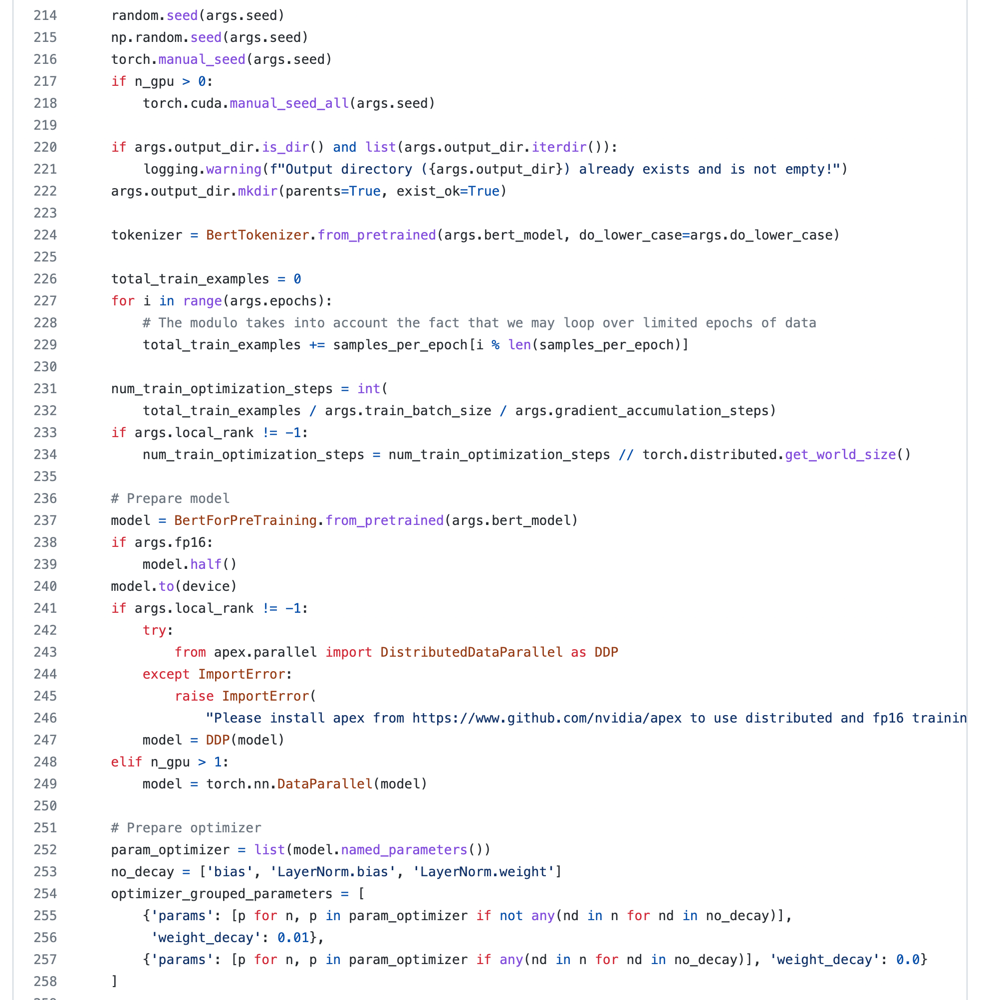

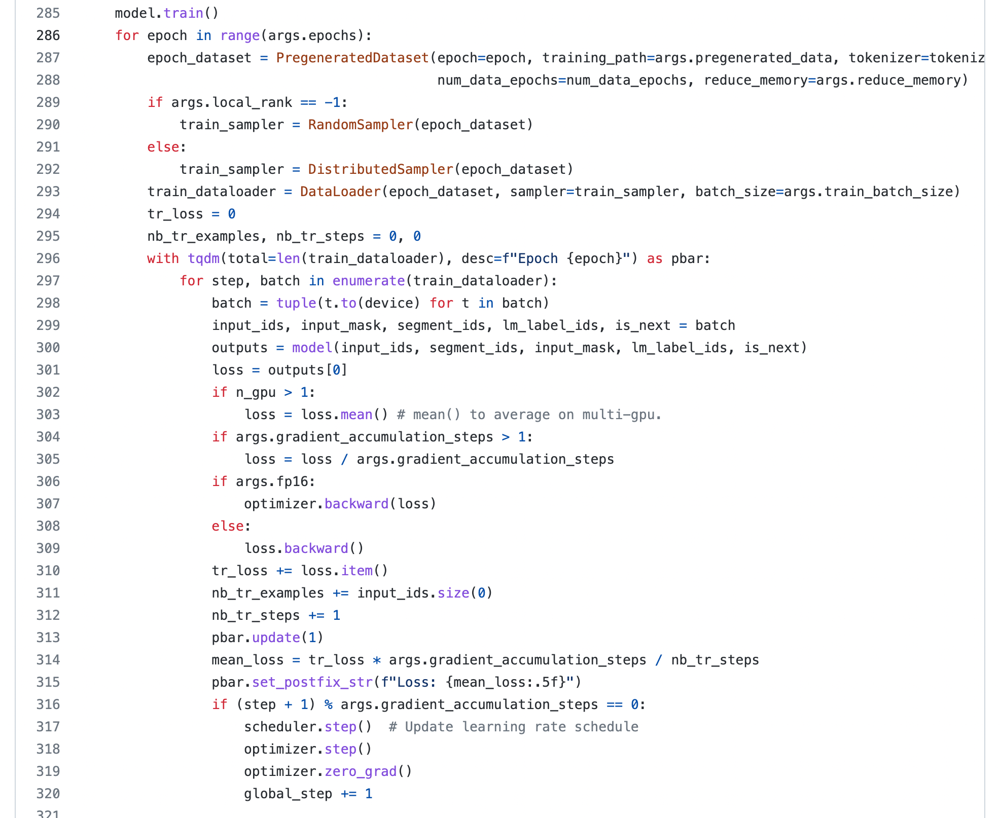

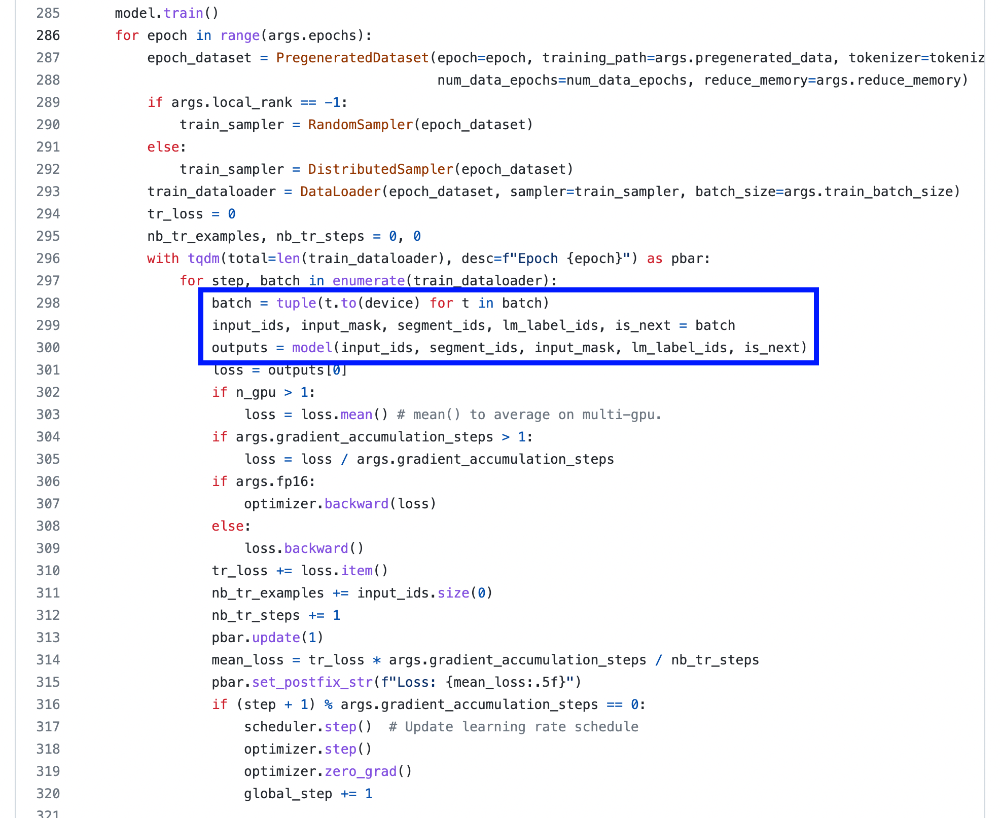

# ML Researcher != Software Engineer

# Step 1 towards reproducable code

# Get rid of the copy & paste

# Install

pip install pytorch-lightning torch torchvision matplotlib ipyplot

# Imports & Helpers

In [1]:
import os
import torch
from torch import nn
import torch.nn.functional as F
from torchvision.datasets import MNIST, CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader, random_split
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import ipyplot
import numpy as np

def to_np(imgs):
    np_ary = (imgs.permute(0,2,3,1)*255).numpy().astype(np.uint8) 
    if np_ary.shape[3] == 1:
        return np_ary[:,:,:,0]
    else:
        return np_ary

# Basic Lightning Model

In [2]:
class BasicModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.setup_model()
    
    def setup_model(self):
        # Takes in 28x28 1 channel images
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28*28, 10),
            nn.ReLU()
        )

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        x, y = batch
        y = F.one_hot(y, 10).float()
        y_hat = self.model(x)
        loss = F.mse_loss(y_hat, y)
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return optimizer

# Data Loader

In [3]:
dataset = MNIST(os.getcwd(), download=True, transform=transforms.ToTensor())
train_loader = DataLoader(dataset, batch_size=100)

# Train the model

In [18]:
basic_model = BasicModel()
trainer = pl.Trainer(limit_train_batches=1000, max_epochs=3)
trainer.fit(model=basic_model, train_dataloaders=train_loader)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 7.9 K 
-------------------------------------
7.9 K     Trainable params
0         Non-trainable params
7.9 K     Total params
0.031     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


# GPU Training

In [19]:
basic_model = BasicModel()
trainer = pl.Trainer(accelerator="mps", limit_train_batches=1000, max_epochs=3)
trainer.fit(model=basic_model, train_dataloaders=train_loader)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 7.9 K 
-------------------------------------
7.9 K     Trainable params
0         Non-trainable params
7.9 K     Total params
0.031     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


# Validation

In [6]:
class TrainAndValModel(BasicModel):
    def __init__(self):
        super().__init__()
        self.setup_dataset()
        
    def setup_dataset(self):
        # Assign train/val datasets for use in dataloaders
        self.train_set = MNIST(os.getcwd(), train=True, download=True, transform=transforms.ToTensor())
        self.val_set = MNIST(os.getcwd(), train=False, download=True, transform=transforms.ToTensor())

    def train_dataloader(self):
        return DataLoader(self.train_set, batch_size=100)

    def val_dataloader(self):
        return DataLoader(self.val_set, batch_size=100)



In [26]:
class TrainAndValModel2(TrainAndValModel):
    def evaluate(self, batch, batch_idx):
        x, y = batch
        y = F.one_hot(y, 10).float()
        y_hat = self.model(x)
        loss = F.mse_loss(y_hat, y)
        return loss, y_hat
     
    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        loss, _ = self.evaluate(batch, batch_idx)
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        loss, pred = self.evaluate(batch, batch_idx)
        self.log("val_loss", loss)
        
        # Show a few from the validation step
        if batch_idx == 0:
            # Choose random examples to display
            rand_idxs = torch.randperm(x.size()[0])
            x = x.cpu().index_select(0, rand_idxs)
            y = y.cpu().index_select(0, rand_idxs)
            pred = pred.cpu().index_select(0, rand_idxs)
            
            labels = []
            for yv, yhatv in zip(y, pred):
                yhatv = yhatv.argmax()
                labels.append((f"✓ {yhatv} == {yv}" if yv == yhatv else f"✗ {yhatv} != {yv}"))
            ipyplot.plot_images(to_np(x[0:6, :, :, :]), labels, max_images=6, img_width=150)
        return loss
    

In [27]:
class AdvancedModel(TrainAndValModel2):
    def setup_model(self):
        # Takes in 28x28 1 channel images
        self.model = nn.Sequential(
            nn.Conv2d(1, 32, 5, padding=1), nn.ReLU(), # 28x28
            nn.MaxPool2d(2,2),
            nn.Conv2d(32, 64, 5, padding=1), nn.ReLU(), # 14x14
            nn.MaxPool2d(2,2), # 5x5
            nn.Flatten(),
            nn.Linear(64*5*5, 256), nn.ReLU(),
            nn.Linear(256, 128), nn.ReLU(),
            nn.Linear(128, 10), nn.ReLU()
        )


In [28]:
adv_model = AdvancedModel()
trainer = pl.Trainer(accelerator="mps", max_epochs=3)
trainer.fit(model=adv_model)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 496 K 
-------------------------------------
496 K     Trainable params
0         Non-trainable params
496 K     Total params
1.985     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


# Hyperparameters

In [9]:
class AdvWithHyper(AdvancedModel):
    def __init__(self, training_set='mnist'):
        # Save kwargs into hparams dict
        self.save_hyperparameters()

        super().__init__()

    def setup_dataset(self):
        # Assign train/val datasets for use in dataloaders
        if self.hparams.training_set == 'mnist':
            self.train_set = MNIST(os.getcwd(), train=True, download=True, transform=transforms.ToTensor())
            self.val_set = MNIST(os.getcwd(), train=False, download=True, transform=transforms.ToTensor())
        else:
            self.train_set = CIFAR10(os.getcwd(), train=True, download=True, transform=transforms.ToTensor())
            self.val_set = CIFAR10(os.getcwd(), train=False, download=True, transform=transforms.ToTensor())

    def setup_model(self):
        # Takes in 28x28 1 channel images
        in_chans = 1 if self.hparams.training_set == 'mnist' else 3
        hw = 28 if self.hparams.training_set == 'mnist' else 32
        layer3_hw = ((hw//2//2//2)+2)
        self.model = nn.Sequential(
            nn.Conv2d(in_chans, 32, 5, padding=1), nn.ReLU(), # 28x28
            nn.MaxPool2d(2,2),
            nn.Conv2d(32, 64, 5, padding=1), nn.ReLU(), # 14x14
            nn.MaxPool2d(2,2), # 5x5
            nn.Flatten(),
            nn.Linear(64*layer3_hw*layer3_hw, 256), nn.ReLU(),
            nn.Linear(256, 128), nn.ReLU(),
            nn.Linear(128, 10), nn.ReLU()
        )


Files already downloaded and verified
Files already downloaded and verified


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 677 K 
-------------------------------------
677 K     Trainable params
0         Non-trainable params
677 K     Total params
2.712     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]


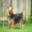
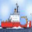
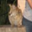
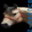
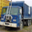
...
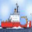
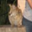
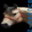
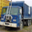
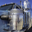

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


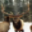
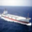
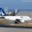
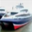
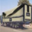
...
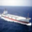
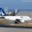
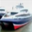
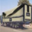
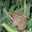

Validation: 0it [00:00, ?it/s]


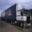
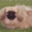
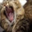
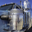
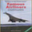
...
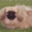
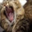
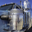
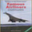
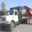

Validation: 0it [00:00, ?it/s]


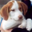
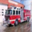
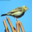
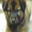
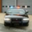
...
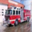
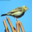
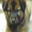
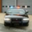
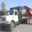

Validation: 0it [00:00, ?it/s]


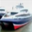
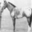
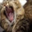
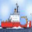
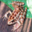
...
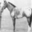
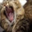
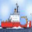
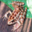
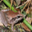

Validation: 0it [00:00, ?it/s]


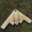
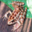
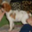
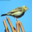
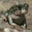
...
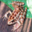
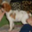
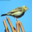
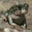
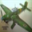

`Trainer.fit` stopped: `max_epochs=5` reached.


In [29]:
adv_with_hyper = AdvWithHyper(training_set='cifar10')
trainer = pl.Trainer(accelerator="mps", devices=1, max_epochs=5)
trainer.fit(model=adv_with_hyper)

# Look at what I'm not doing
- train/eval setup
- gradient management
- back propigation
- moving tensors to devices/device setup


# Mixed Percision Training (16bit/32bit)

Files already downloaded and verified
Files already downloaded and verified


Using 16bit native Automatic Mixed Precision (AMP)
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 677 K 
-------------------------------------
677 K     Trainable params
0         Non-trainable params
677 K     Total params
1.356     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]


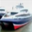
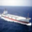
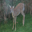
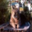
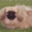
...
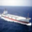
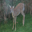
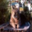
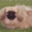
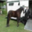

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]


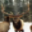
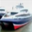
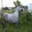
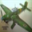
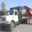
...
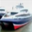
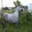
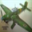
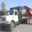
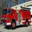

Validation: 0it [00:00, ?it/s]


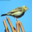
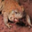
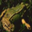
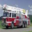
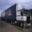
...
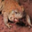
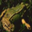
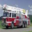
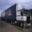
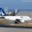

Validation: 0it [00:00, ?it/s]


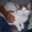
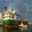
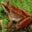
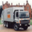
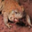
...
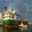
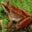
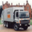
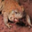
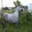

`Trainer.fit` stopped: `max_epochs=3` reached.


In [30]:
adv_with_hyper = AdvWithHyper(training_set='cifar10')
trainer = pl.Trainer(accelerator="mps", max_epochs=3, precision=16)
trainer.fit(model=adv_with_hyper)

# Mixed Percision Training
- Lower memory consumption (bigger models on a single gpu)
- 2x-3x faster on some hardware
- Mixed > Full 16 (more stability, few trade-off's)
- Single flag in Pytorch Lightning

# Finding the batch size

In [12]:
trainer = pl.Trainer(auto_scale_batch_size=True)

trainer = pl.Trainer(auto_scale_batch_size='binsearch')


class ModelWithBatch(AdvancedModel):
    def __init__(self, batch_size=32):
        self.save_hyperparameters()
        super().__init__()
        


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


# Find the learning rate

In [32]:
class AdvancedWithLr(AdvancedModel):
    def __init__(self, learning_rate=1e-3):
        super().__init__()
        self.learning_rate = learning_rate
        
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


adv_with_lr = AdvancedWithLr()
trainer = pl.Trainer(auto_lr_find=True, max_epochs=3)

trainer.tune(adv_with_lr)
trainer.fit(model=adv_with_lr)


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=93` reached.
LR finder stopped early after 93 steps due to diverging loss.
Learning rate set to 0.001584893192461114
Restoring states from the checkpoint path at /Users/ryanstout/Sites/mtp/pytorch_lightning/.lr_find_dfae258b-b727-432f-96f9-d98f45a9bac4.ckpt

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 496 K 
-------------------------------------
496 K     Trainable params
0         Non-trainable params
496 K     Total params
1.985     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

/Users/ryanstout/Library/Caches/pypoetry/virtualenvs/pytorch-lightning-Sj4_4Qni-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:653: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=100` reached.
Restoring states from the checkpoint path at /Users/ryanstout/Sites/mtp/pytorch_lightning/.lr_find_0f4c54c8-42b4-461d-89cd-ce1617b5b870.ckpt
/var/folders/nw/jf823jcn0l759h3pchsfhsfc0000gn/T/ipykernel_71613/1895324682.py:6: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


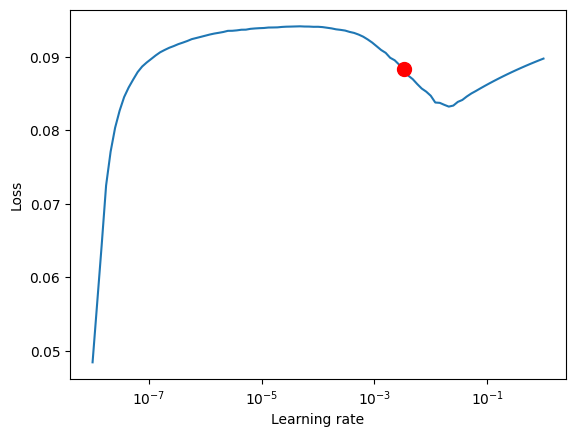

In [34]:

adv_with_lr = AdvancedWithLr()
trainer = pl.Trainer(auto_lr_find=True, max_epochs=3)

lr_finder = trainer.tuner.lr_find(adv_with_lr)
fig = lr_finder.plot(suggest=True)
fig.show()


# Callbacks

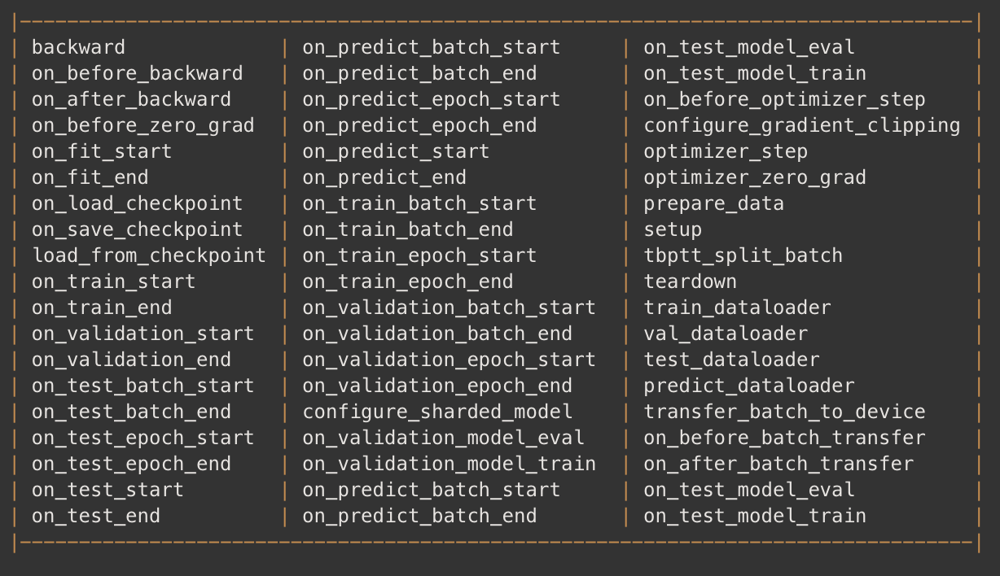

# GPU (Advanced)

In [15]:
# Create Tensors on self.device

class TensorModel(AdvancedModel):
    def __init__(self, learning_rate=1e-3):
        super().__init__()
        
        self.my_tens = torch.Tensor([3,5,5], device=self.device)

adv_with_hyper = AdvWithHyper()
# trainer = pl.Trainer(gpus=-1, max_epochs=3)
# trainer.fit(model=adv_with_hyper)


# Checkpoints

- 16-bit scaling factor (if using 16-bit precision training)
- Current epoch
- Global step
- LightningModule’s state_dict
- State of all optimizers
- State of all learning rate schedulers
- State of all callbacks (for stateful callbacks)
- State of datamodule (for stateful datamodules)
- The hyperparameters used for that model if passed in as hparams (Argparse.Namespace)
- The hyperparameters used for that datamodule if passed in as hparams (Argparse.Namespace 
- State of Loops (if using Fault-Tolerant training)

In [16]:
adv_with_hyper = AdvWithHyper()
trainer = pl.Trainer(accelerator="mps", max_epochs=3, default_root_dir='checkpoints')
trainer.fit(model=adv_with_hyper)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 496 K 
-------------------------------------
496 K     Trainable params
0         Non-trainable params
496 K     Total params
1.985     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


In [17]:
adv_with_hyper = AdvWithHyper.load_from_checkpoint('checkpoints/lightning_logs/version_0/checkpoints/epoch=2-step=1800.ckpt')

trainer = pl.Trainer(accelerator="mps", max_epochs=3, default_root_dir='checkpoints')
trainer.fit(model=adv_with_hyper)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type       | Params
-------------------------------------
0 | model | Sequential | 496 K 
-------------------------------------
496 K     Trainable params
0         Non-trainable params
496 K     Total params
1.985     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.


# Conclusion

- Boilerplate sucks
- Pytorch Lightning is great!

- Saves a lot of code/time
- Free performance improvements
- Easy to learn


# Questions